In [594]:
import torch 
import matplotlib.pyplot as plt 
import numpy as np
from bindsnet.network import Network
from bindsnet.network.nodes import Input, LIFNodes
from bindsnet.network.topology import Connection
from bindsnet.network.monitors import Monitor
from bindsnet.analysis.plotting import plot_spikes, plot_voltages
from bindsnet.learning import PostPre

In [595]:
#simulation time
time = 100 #observation time
N = 10 #number of samples

#other parameters according Lee et.al(2016)
alpha = 4
beta  = 10
lamda = 0.002
rho   = 0.0001
eta_w  = 0.002        #learning rate for synaptic weight
eta_th = 0.1 * eta_w  #learning rate for voltage threshold

#create the network
network = Network()

#create and add input, hidden and output layers
input_layer  = Input(n= 28 * 28)
hidden_layer = LIFNodes(n=100, thresh = -63.0) 
output_layer = LIFNodes(n=10, thresh = -64.0)

network.add_layer(
    layer = input_layer, name = "A"
)

network.add_layer(
    layer = hidden_layer, name = "B"
)

network.add_layer(
    layer = output_layer, name = "C"
)



In [596]:
#create connection between input and hidden layer
forward_connection_1 = Connection(
    source = input_layer,
    target = hidden_layer,
    #w = 0.07 + 0.1 * torch.randn(input_layer.n, hidden_layer.n), # random weight initialization
    w = np.sqrt(3.0/input_layer.n) - 2*np.sqrt(3.0/input_layer.n)*torch.rand(input_layer.n, hidden_layer.n)
   
)

network.add_connection(
    connection= forward_connection_1 , source="A", target="B"
)

In [597]:
#create connection between hidden and output layer
forward_connection_2 = Connection(
    source = hidden_layer,
    target = output_layer,
    #w = 0.05 + 0.1 * torch.randn(hidden_layer.n, output_layer.n),
    w = np.sqrt(3.0/hidden_layer.n) - 2*np.sqrt(3.0/hidden_layer.n)*torch.rand(hidden_layer.n, output_layer.n)
)

network.add_connection(
    connection= forward_connection_2 , source="B", target="C"
)

In [598]:
weight1 = forward_connection_1.w
weight2 = forward_connection_2.w 

print(weight1)
print("min and max weight of layer 1 = " +str(torch.min(weight1))+" " + str(torch.max(weight1)))
print("min and max weight of layer 2 = " +str(torch.min(weight2))+" " + str(torch.max(weight2)))

Parameter containing:
tensor([[ 1.5448e-02,  5.5738e-02, -4.7938e-02,  ..., -4.1646e-03,
          1.9806e-02, -3.6412e-02],
        [ 4.2580e-02,  4.4075e-02,  2.5886e-02,  ..., -3.3983e-03,
          1.9187e-02,  5.8714e-02],
        [-3.3148e-02, -5.3249e-02,  8.0891e-03,  ...,  5.2924e-02,
          1.6107e-02,  2.9686e-02],
        ...,
        [-3.8825e-02, -4.9019e-02, -2.8776e-02,  ..., -1.3394e-02,
         -1.1398e-02,  4.3185e-02],
        [ 3.2520e-02,  4.2903e-02,  2.2451e-02,  ..., -5.5490e-02,
         -1.8915e-02, -3.8266e-02],
        [-5.3085e-05, -4.7799e-02,  5.3657e-02,  ..., -2.4989e-02,
          3.1998e-03,  7.3727e-03]])
min and max weight of layer 1 = tensor(-0.0619) tensor(0.0619)
min and max weight of layer 2 = tensor(-0.1731) tensor(0.1727)


In [599]:
type(forward_connection_1)

bindsnet.network.topology.Connection

In [600]:
#create recurrent connection in hidden layer
recurrent_connection = Connection(
    source= hidden_layer,
    target= hidden_layer,
    w = 0.001 * (torch.eye(hidden_layer.n)-1),
)

network.add_connection(
    connection=recurrent_connection,source="B",target="B"
)

print(torch.max(recurrent_connection.w))
print(torch.min(recurrent_connection.w))

tensor(0.)
tensor(-0.0010)


In [601]:
#create and add input and output layer monitors
input_monitor = Monitor(
    obj  = input_layer,
    state_vars= ("s"), #record spikes
    time = time * N,
)

hidden_monitor = Monitor(
    obj = hidden_layer,
    state_vars=("s","v"),
    time = time * N,
)

output_monitor = Monitor(
    obj = output_layer, 
    state_vars= ("s", "v"),
    time = time * N,
)

network.add_monitor(monitor=input_monitor, name="A")
network.add_monitor(monitor=hidden_monitor, name="B")
network.add_monitor(monitor=output_monitor, name="C")


In [602]:

# Create input spike data, where each spike is distributed according to Bernoulli
input_data = torch.bernoulli(0.1 * torch.ones(time * N, input_layer.n)).byte()
inputs = {"A": input_data}

# Simulate network on input data.
network.run(inputs=inputs, time=time *N)

In [603]:
# Retrieve and plot simulation spike, voltage data from monitors.
spikes = {
    "A": input_monitor.get("s"), 
    "B": hidden_monitor.get("s"),
    "C": output_monitor.get("s")
}
voltages = {"B": hidden_monitor.get("v"),
    "C": output_monitor.get("v")}
#create a random target label y
y = torch.randint(low=0,high=10,size=[10,1])
y_onehot = torch.nn.functional.one_hot(y)
y_onehot = y_onehot.float() #convert to one hot encoding


In [604]:


#number of output spikes during one integration time in each class

n_out_spikes = spikes["C"].float()
print(n_out_spikes.shape)
print(torch.sum(n_out_spikes,dim=0))


#calculate the output vector o
# vector o = #spike(i)/#max(spike(j))
O_vec = torch.zeros(N,1,10)
Loss_vec = torch.zeros(N,1)
for i in range(N):
    sum_out = torch.sum(n_out_spikes[i*100:(i*100)+99,:,:],dim=0) #sum every 100 samples
    #print(sum_out)
    O_vec[i,:,:] = sum_out / torch.max(sum_out) #calculate the output vector
    #print(O_vec[i,:,:])

#calculate the loss objective function

Loss__vec = 0.5*torch.pow(torch.norm(O_vec - y_onehot,dim=2),2)
print(Loss__vec)
#print(O_vec - y_onehot)
#print(torch.norm(O_vec - y_onehot,dim=2))



torch.Size([1000, 1, 10])
tensor([[ 2.,  0.,  0., 13.,  1.,  1., 20.,  9.,  1., 29.]])
tensor([[1.2500],
        [0.7778],
        [0.7500],
        [1.1667],
        [1.2812],
        [1.7500],
        [1.1563],
        [1.8333],
        [2.2500],
        [0.6667]])


In [605]:
print(y_onehot[5,:])
print(O_vec[5,:])

tensor([[0., 0., 0., 0., 0., 0., 0., 1., 0., 0.]])
tensor([[0.0000, 0.0000, 0.0000, 0.5000, 0.0000, 0.0000, 1.0000, 0.0000, 0.5000,
         1.0000]])


In [606]:
a = torch.tensor([1,2,3],dtype=float)
b = torch.tensor([4,3,3],dtype=float)
c = 0.5 * torch.pow(torch.norm(a-b),2)
print(c)

tensor(5.0000, dtype=torch.float64)


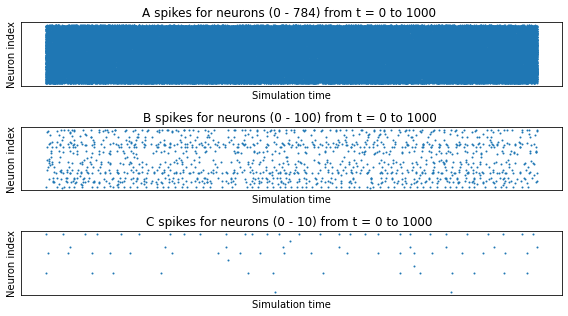

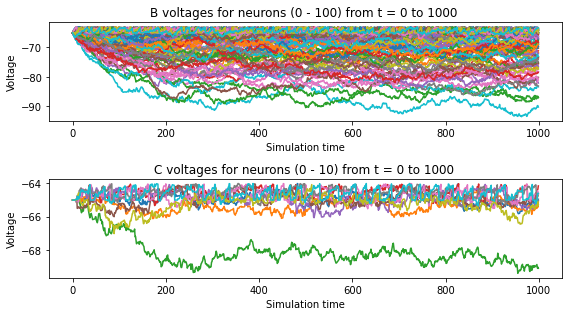

In [607]:
#plot the result
plt.ioff()
plot_spikes(spikes)
plot_voltages(voltages, plot_type="line")
plt.show()

In [608]:
""" #the output prediction
y_pred = spikes["C"].int()
y_pred_ohe = torch.argmax(y_pred, dim=2) #convert to one hot encoding
#print(class_digit[20:30,:,:])
#target output class"""
y = torch.randint(low=0,high=10,size=[100,1])
y_onehot = torch.nn.functional.one_hot(y)
y_onehot = y_onehot.float()
print(y_onehot.shape)
print(y_pred_ohe.shape) 
print(y_onehot)

torch.Size([100, 1, 10])
torch.Size([100, 1])
tensor([[[0., 0., 0., 0., 0., 0., 1., 0., 0., 0.]],

        [[0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]],

        [[0., 0., 0., 1., 0., 0., 0., 0., 0., 0.]],

        [[0., 0., 1., 0., 0., 0., 0., 0., 0., 0.]],

        [[0., 0., 0., 0., 0., 0., 0., 1., 0., 0.]],

        [[1., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],

        [[0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]],

        [[0., 0., 0., 0., 0., 0., 0., 1., 0., 0.]],

        [[0., 0., 0., 0., 0., 0., 0., 0., 1., 0.]],

        [[1., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],

        [[0., 0., 0., 0., 0., 0., 0., 1., 0., 0.]],

        [[0., 0., 0., 0., 0., 0., 0., 1., 0., 0.]],

        [[0., 0., 0., 0., 0., 0., 1., 0., 0., 0.]],

        [[1., 0., 0., 0., 0., 0., 0., 0., 0., 0.]],

        [[0., 0., 0., 0., 0., 0., 1., 0., 0., 0.]],

        [[0., 0., 1., 0., 0., 0., 0., 0., 0., 0.]],

        [[0., 0., 0., 0., 1., 0., 0., 0., 0., 0.]],

        [[0., 0., 0., 0., 1., 0., 0., 0., 0., 0.]],

